# Resim Yüklemek için İlk Yöntem

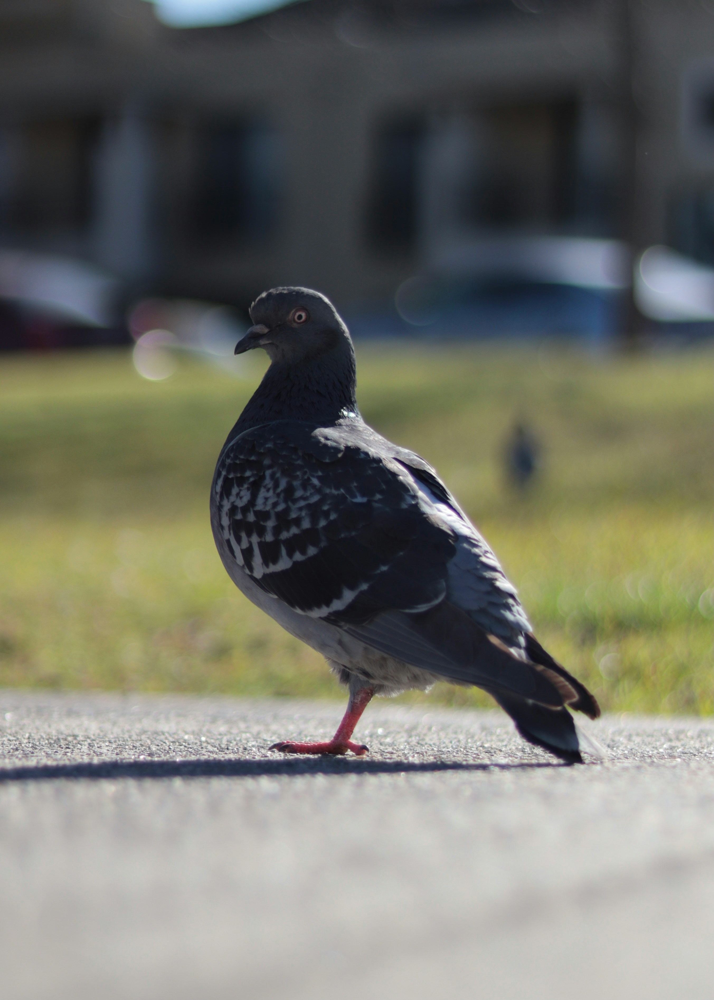

In [4]:
# Google Colab ortamında OpenCV ile resim gösterimi için gerekli fonksiyon kütüphanesi import ediliyor.
from google.colab.patches import cv2_imshow

# OpenCV kütüphanesi import ediliyor. Bu kütüphane görüntü işleme işlemleri için kullanılır.
import cv2

# Belirtilen dosya yolundaki görüntü, cv2.imread() fonksiyonu ile okunuyor.
# "/content/guvercin.jpg" dosya yolu, Colab'daki yüklü dosyanın yolunu belirtir.
img = cv2.imread("/content/guvercin.jpg")

# cv2_imshow() fonksiyonu, Google Colab üzerinde bir resmi görüntülemek için kullanılır.
# img değişkeniyle belirtilen resmi ekranda gösteriyoruz.
cv2_imshow(img)


# Resim Yüklemek için İkinci Yöntem

In [8]:
from google.colab import files

# Resmi yüklemek
uploaded = files.upload()

Saving kopek.jpg to kopek.jpg


In [9]:
image = cv2.imread("/content/kopek.jpg")

# Şimdi resim, resmi oluşturan piksellerin hepsini depolayan bir nesnedir
# Piksellerin değerlerini kontrol etmek için basitçe resmi yazdırabilirsiniz
# Ayrıca resmin değerlerini de yazdırabilirsiniz
height, width, channels = image.shape
print("Resmin genişliği:", width)
print("Resmin yüksekliği:", height)
print("Kanal sayısı:", channels)

Resmin genişliği: 5184
Resmin yüksekliği: 3456
Kanal sayısı: 3


# Kütüphane Yüklemek 📚
- rembg (remove back-ground)

In [12]:
!pip install rembg

In [15]:
!pip install onnxruntime #hata alınırsa yüklenmesi gerekiyor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 51.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 6.0 MB/s eta 0:00:00


# Resmin Arkaplanını Kaldırmak 🧹

In [16]:
from rembg import remove

input_path = '/content/guvercin.jpg'
output_path = 'removebg.jpg'

with open(input_path, 'rb') as i:
    with open(output_path, 'wb') as o:
        input = i.read()
        output = remove(input)
        o.write(output)

100%|████████████████████████████████████████| 176M/176M [00:00<00:00, 102GB/s]


# Arkaplan Değiştirmek 🌄

In [28]:
import numpy as np

def change_back(background, img):
  """ Resimlerin siyah arka planını başka bir görüntüyle değiştiren bir fonksiyon.
    İki argüman kabul eder: arka plan görüntüsü (background) ve görüntünün kendisi (img).
    Fonksiyon, görüntünün sol üst köşesinden başlayacak. Siyah pikselleri (0 değerine sahip olanları) arayacak
    ve onları arka plan görüntüsünün pikselleriyle değiştirecek"""

  x, y = 0, 0
  background = cv2.resize(background, (img.shape[1], img.shape[0]), interpolation = cv2.INTER_AREA)
  res = np.copy(background)
  place = res[y: y + img.shape[0], x: x + img.shape[1]]
  a = img[..., 3:].repeat(3, axis=2).astype('uint16')
  place[...] = (place.astype('uint16') * (255 - a) // 255) + img[..., :3].astype('uint16') * a // 255
  return res

In [35]:
guvercin=cv2.imread("/content/removebg.jpg",cv2.IMREAD_UNCHANGED)
galaksi=cv2.imread("/content/galaxy.jpg")


In [36]:
result = change_back(galaksi,guvercin)
cv2.imwrite("result.jpg",result)


True

# Kodların tamamlanmış hali

In [38]:
import cv2
import numpy as np
from rembg import remove

def change_back(background, img):
    """
    Resimlerin siyah arka planını başka bir görüntüyle değiştiren bir fonksiyon.
    İki argüman kabul eder: arka plan görüntüsü (background) ve görüntünün kendisi (img).
    """
    # Arka planı boyut olarak img ile eşleştir
    background = cv2.resize(background, (img.shape[1], img.shape[0]), interpolation=cv2.INTER_AREA)

    # Eğer img alfa kanalına sahip değilse (şeffaflık bilgisi yoksa), hata verdir
    if img.shape[-1] != 4:
        raise ValueError("Girdi resmi alfa kanalına sahip değil. Lütfen rembg çıktısını kontrol edin.")

    res = np.copy(background)
    a = img[..., 3:].repeat(3, axis=2).astype('uint16')  # Alfa kanalını genişlet
    res = (res.astype('uint16') * (255 - a) // 255) + (img[..., :3].astype('uint16') * a // 255)
    return res.astype('uint8')  # Sonucu uint8'e döndür

# Arka planı kaldır ve dosyayı kaydet
input_path = '/content/kopek.jpg'
output_path = 'remove-dog-bg.png'

with open(input_path, 'rb') as i:
    with open(output_path, 'wb') as o:
        input = i.read()
        output = remove(input)  # Rembg kullanarak arka planı kaldırblob:https://colab.research.google.com/bcaa62b9-158c-4a6d-a62c-91252aa7b93b
        o.write(output)
blob:https://colab.research.google.com/bcaa62b9-158c-4a6d-a62c-91252aa7b93b
# Görselleri yükle
kopek = cv2.imread("/content/remove-dog-bg.png", cv2.IMREAD_UNCHANGED)  # PNG kullan ve alfa kanalını oku
uzay = cv2.imread("/content/uzay.jpg")

# Eğer resimler doğru yüklenmediyse hata verdirin
if kopek is None or uzay is None:
    raise FileNotFoundError("Resimlerden biri yüklenemedi! Dosya yollarını kontrol edin.")

# İşlemi uygula
result2 = change_back(uzay, kopek)
cv2.imwrite("result2.jpg", result2)


True